# weatherAUS IEEE Day

This is for IEEE Competition. We were given 3 dataset (train, test and validation) of weatherAUS. Our motivation for this project is to find out which attributes affect if it will rain and how can we predict if it will rain given attributes like Location, MinTemp, MaxTemp, Rainfall and more.

In [297]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
sb.set()
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import RobustScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

In [298]:
full_dataframe = pd.read_csv("weatherAUS_Train_Set.csv", index_col=0, parse_dates=True)
full_dataframe

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,,,,
1,12/1/08,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2,12/2/08,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
3,12/3/08,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,12/4/08,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
5,12/5/08,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102257,9/2/16,MountGambier,5.5,16.3,0.8,NaN,NaN,E,30.0,E,...,79.0,53.0,1012.9,1008.6,NaN,3.0,11.5,15.4,No,No
102258,9/3/16,MountGambier,5.3,13.3,0.0,NaN,NaN,W,59.0,NNW,...,80.0,73.0,1009.3,1010.1,NaN,4.0,11.7,12.4,No,Yes
102259,9/4/16,MountGambier,8.0,15.3,4.2,NaN,NaN,NW,44.0,NNW,...,91.0,63.0,1023.2,1024.0,5.0,8.0,12.1,14.6,Yes,No


In [446]:
validate_dataframe = pd.read_csv("weatherAUS_Validate_Set.csv", index_col=0, parse_dates=True)
validate_dataframe

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2016-09-07,MountGambier,7.7,20.7,0.0,NaN,NaN,NNE,50.0,NE,NNE,...,73.0,100.0,1026.2,1020.6,NaN,1.0,14.2,20.1,No,No
2016-09-08,MountGambier,14.2,14.8,0.0,NaN,NaN,NNE,65.0,N,NNW,...,78.0,97.0,1015.2,1012.0,8.0,8.0,14.8,13.6,No,Yes
2016-09-09,MountGambier,11.2,15.1,53.2,NaN,NaN,SW,43.0,SW,WSW,...,82.0,91.0,1009.8,1011.7,8.0,8.0,13.8,11.8,Yes,Yes
2016-09-10,MountGambier,5.8,14.1,4.0,NaN,NaN,W,35.0,WSW,W,...,78.0,64.0,1019.5,1018.2,8.0,8.0,11.5,13.0,Yes,No
2016-09-11,MountGambier,8.4,15.5,0.8,NaN,NaN,W,39.0,NNW,WSW,...,94.0,83.0,1018.7,1017.2,8.0,8.0,11.4,12.2,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-02-28,Walpole,14.2,23.7,0.0,NaN,NaN,SE,50.0,ESE,SE,...,64.0,59.0,1018.6,1017.6,NaN,NaN,19.9,22.1,No,No
2012-02-29,Walpole,15.3,23.9,0.0,NaN,NaN,ESE,59.0,ESE,ESE,...,62.0,58.0,1023.0,1021.3,NaN,NaN,19.8,22.2,No,No
2012-03-01,Walpole,14.7,26.0,0.0,NaN,NaN,ENE,54.0,E,SE,...,57.0,52.0,1023.1,1019.2,NaN,NaN,20.2,23.8,No,No


In [447]:
weatherAUS_Test_Set_Without_Y = pd.read_csv("weatherAUS_Test_Set_Without_Y.csv", index_col=0, parse_dates=True)
weatherAUS_Test_Set_Without_Y

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,No,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
Date,,,,,,,,,,,,,,,,,,,,,
2012-03-04,Walpole,12.9,28.5,0.0,NaN,NaN,SE,28.0,ESE,1,...,15.0,54.0,53.0,1013.4,1011.8,NaN,NaN,21.8,25.2,No
2012-03-05,Walpole,13.7,29.6,0.0,NaN,NaN,SSW,33.0,ESE,2,...,15.0,59.0,45.0,1016.1,1012.7,NaN,NaN,22.5,27.9,No
2012-03-06,Walpole,17.5,38.1,0.0,NaN,NaN,NNE,50.0,N,3,...,17.0,21.0,11.0,1013.4,1008.6,NaN,NaN,28.9,36.7,No
2012-03-07,Walpole,19.1,24.9,0.0,NaN,NaN,SSW,37.0,WSW,4,...,13.0,71.0,58.0,1015.0,1015.8,NaN,NaN,20.6,21.0,No
2012-03-08,Walpole,13.2,23.1,0.0,NaN,NaN,ESE,33.0,SSE,5,...,17.0,58.0,53.0,1020.4,1018.7,NaN,NaN,19.5,21.6,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,17499,...,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No
2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,17500,...,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No
2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,17501,...,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No


In [299]:
full_dataframe.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,101055.0,12.021216,6.390850,-8.5,7.4,12.0,16.9,33.9
MaxTemp,101235.0,22.686006,6.876903,-4.8,17.7,22.4,27.5,47.3
Rainfall,99692.0,2.513042,9.010921,0.0,0.0,0.0,0.8,371.0
Evaporation,57487.0,5.153268,3.905991,0.0,2.4,4.4,7.0,145.0
Sunshine,50166.0,7.291620,3.831655,0.0,4.3,8.1,10.4,14.5
WindGustSpeed,95760.0,39.690925,13.942264,7.0,30.0,37.0,48.0,135.0
WindSpeed9am,100758.0,13.792761,9.143453,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,100147.0,18.750577,9.205945,0.0,13.0,19.0,24.0,87.0
Humidity9am,100171.0,71.016512,17.743800,3.0,59.0,71.0,84.0,100.0
Humidity3pm,99749.0,53.550903,20.157169,1.0,39.0,54.0,67.0,100.0


# 1. Data Preparation

In [300]:
print("Data type : ", type(full_dataframe))
print("Data dims : ", full_dataframe.shape)
full_dataframe.info()

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (102261, 23)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 102261 entries, 1 to 102261
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           102261 non-null  object 
 1   Location       102261 non-null  object 
 2   MinTemp        101055 non-null  float64
 3   MaxTemp        101235 non-null  float64
 4   Rainfall       99692 non-null   float64
 5   Evaporation    57487 non-null   float64
 6   Sunshine       50166 non-null   float64
 7   WindGustDir    95750 non-null   object 
 8   WindGustSpeed  95760 non-null   float64
 9   WindDir9am     93888 non-null   object 
 10  WindDir3pm     99218 non-null   object 
 11  WindSpeed9am   100758 non-null  float64
 12  WindSpeed3pm   100147 non-null  float64
 13  Humidity9am    100171 non-null  float64
 14  Humidity3pm    99749 non-null   float64
 15  Pressure9am    91594 non-null   float64
 1

# Dropping of Columns

Predicting if it will rain today will not be affected by the date and location since we are going to base on factual attributes of the wind, humidity and pressure. Wind direction at 9am and win direction at 3pm does not help in contributing much.

In [301]:
full_dataframe.isnull().sum() # check if null

Date                 0
Location             0
MinTemp           1206
MaxTemp           1026
Rainfall          2569
Evaporation      44774
Sunshine         52095
WindGustDir       6511
WindGustSpeed     6501
WindDir9am        8373
WindDir3pm        3043
WindSpeed9am      1503
WindSpeed3pm      2114
Humidity9am       2090
Humidity3pm       2512
Pressure9am      10667
Pressure3pm      10622
Cloud9am         40129
Cloud3pm         41276
Temp9am           1571
Temp3pm           2051
RainToday         2569
RainTomorrow      2568
dtype: int64

In [302]:
full_dataframe.WindGustDir.unique()

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', nan, 'ENE',
       'SSE', 'S', 'NW', 'SE', 'ESE', 'E', 'SSW'], dtype=object)

In [303]:
full_dataframe.WindDir9am.unique()

array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', nan, 'SSW', 'N',
       'WSW', 'ESE', 'E', 'NW', 'WNW', 'NNE'], dtype=object)

In [304]:
full_dataframe.WindDir3pm.unique()

array(['WNW', 'WSW', 'E', 'NW', 'W', 'SSE', 'ESE', 'ENE', 'NNW', 'SSW',
       'SW', 'SE', 'N', 'S', 'NNE', nan, 'NE'], dtype=object)

In [305]:
full_dataframe = full_dataframe.drop(columns=['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm'],axis=1)
full_dataframe.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,
1,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
3,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
5,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Cleaning of Data With Missing Values

In [306]:
full_dataframe.RainToday.unique()

array(['No', 'Yes', nan], dtype=object)

In [307]:
full_dataframe.RainTomorrow.unique()

array(['No', 'Yes', nan], dtype=object)

Given a dataset, our aim is to predict RainTomorrow accuracy. We are now in the data preperation phase. Besides date and location, there are empty fields in other variables. If RainTomorrow is empty, then there is no way we can use our model to train and predict RainTomorrow.

Other variables seems to be able to provide us essential data to predict RainTomorrow, so no need to drop columns.

In [308]:
# remove empty RainTomorrow
clean_dataframe = full_dataframe[full_dataframe['RainTomorrow'].notna()]
clean_dataframe.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,
1,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
3,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
5,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [309]:
clean_dataframe['RainTomorrow'].unique()


array(['No', 'Yes'], dtype=object)

In [310]:
# remove empty RainTomorrow
clean_dataframe = full_dataframe[full_dataframe['RainToday'].notna()]
clean_dataframe.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,
1,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
3,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
5,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [311]:
# remove empty RainTomorrow
clean_dataframe = clean_dataframe[clean_dataframe['RainTomorrow'].notna()]
clean_dataframe.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,,,,,
1,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
3,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
4,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
5,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [312]:
clean_dataframe.isnull().sum() # check if null

MinTemp            349
MaxTemp            207
Rainfall             0
Evaporation      42607
Sunshine         49660
WindGustSpeed     5624
WindSpeed9am       907
WindSpeed3pm      1695
Humidity9am       1086
Humidity3pm       1638
Pressure9am       9462
Pressure3pm       9471
Cloud9am         37540
Cloud3pm         38708
Temp9am            589
Temp3pm           1193
RainToday            0
RainTomorrow         0
dtype: int64

In [313]:
clean_dataframe.RainTomorrow.unique()

array(['No', 'Yes'], dtype=object)

In [314]:
clean_dataframe["RainTomorrow"]

Row
1          No
2          No
3          No
4          No
5          No
         ... 
102257     No
102258    Yes
102259     No
102260     No
102261     No
Name: RainTomorrow, Length: 98585, dtype: object

In [315]:
clean_dataframe.describe

<bound method NDFrame.describe of         MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  WindGustSpeed  \
Row                                                                        
1          13.4     22.9       0.6          NaN       NaN           44.0   
2           7.4     25.1       0.0          NaN       NaN           44.0   
3          12.9     25.7       0.0          NaN       NaN           46.0   
4           9.2     28.0       0.0          NaN       NaN           24.0   
5          17.5     32.3       1.0          NaN       NaN           41.0   
...         ...      ...       ...          ...       ...            ...   
102257      5.5     16.3       0.8          NaN       NaN           30.0   
102258      5.3     13.3       0.0          NaN       NaN           59.0   
102259      8.0     15.3       4.2          NaN       NaN           44.0   
102260     10.4     15.9       0.8          NaN       NaN           35.0   
102261      4.8     19.0       0.2          NaN       

In [316]:
print("Reduction of",102261-99693, "Rows of Data")

Reduction of 2568 Rows of Data


# Change attributes of RainToday and RainTomorrow from "Yes"/"No" to Numeric Values to Analyse

In [317]:
# changing yes no into 1/0
from sklearn.preprocessing import LabelEncoder
colslabel =['RainToday','RainTomorrow']
clean_dataframe[colslabel] = clean_dataframe[colslabel].apply(LabelEncoder().fit_transform)
print(clean_dataframe)

        MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  WindGustSpeed  \
Row                                                                        
1          13.4     22.9       0.6          NaN       NaN           44.0   
2           7.4     25.1       0.0          NaN       NaN           44.0   
3          12.9     25.7       0.0          NaN       NaN           46.0   
4           9.2     28.0       0.0          NaN       NaN           24.0   
5          17.5     32.3       1.0          NaN       NaN           41.0   
...         ...      ...       ...          ...       ...            ...   
102257      5.5     16.3       0.8          NaN       NaN           30.0   
102258      5.3     13.3       0.0          NaN       NaN           59.0   
102259      8.0     15.3       4.2          NaN       NaN           44.0   
102260     10.4     15.9       0.8          NaN       NaN           35.0   
102261      4.8     19.0       0.2          NaN       NaN           26.0   

        Win

In [318]:
clean_dataframe['RainToday'].fillna(clean_dataframe['RainToday'].mode()[0], inplace=True)
clean_dataframe['RainTomorrow'].fillna(clean_dataframe['RainTomorrow'].mode()[0], inplace=True)

In [319]:
clean_dataframe.isna().sum()

MinTemp            349
MaxTemp            207
Rainfall             0
Evaporation      42607
Sunshine         49660
WindGustSpeed     5624
WindSpeed9am       907
WindSpeed3pm      1695
Humidity9am       1086
Humidity3pm       1638
Pressure9am       9462
Pressure3pm       9471
Cloud9am         37540
Cloud3pm         38708
Temp9am            589
Temp3pm           1193
RainToday            0
RainTomorrow         0
dtype: int64

# Assumption for Our Model - Replacing Missing Values With Mean

In [320]:
clean_dataframe.MinTemp.fillna(clean_dataframe.MinTemp.mean(),inplace=True)
clean_dataframe.MaxTemp.fillna(clean_dataframe.MaxTemp.mean(),inplace=True)
clean_dataframe.Rainfall.fillna(clean_dataframe.Rainfall.mean(),inplace=True)
clean_dataframe.MaxTemp.fillna(clean_dataframe.MaxTemp.mean(),inplace=True)
clean_dataframe.WindSpeed9am.fillna(clean_dataframe.WindSpeed9am.mean(),inplace=True)
clean_dataframe.WindSpeed3pm.fillna(clean_dataframe.WindSpeed3pm.mean(),inplace=True)
clean_dataframe.Humidity9am.fillna(clean_dataframe.Humidity9am.mean(),inplace=True)
clean_dataframe.Temp9am.fillna(clean_dataframe.Temp9am.mean(),inplace=True)
clean_dataframe.Temp3pm.fillna(clean_dataframe.Temp3pm.mean(),inplace=True)
clean_dataframe.RainToday.fillna(clean_dataframe.RainToday.mean(),inplace=True)
clean_dataframe.Humidity3pm.fillna(clean_dataframe.Humidity3pm.mean(),inplace=True)

In [321]:
full_dataframe.isnull().sum() # check if null

MinTemp           1206
MaxTemp           1026
Rainfall          2569
Evaporation      44774
Sunshine         52095
WindGustSpeed     6501
WindSpeed9am      1503
WindSpeed3pm      2114
Humidity9am       2090
Humidity3pm       2512
Pressure9am      10667
Pressure3pm      10622
Cloud9am         40129
Cloud3pm         41276
Temp9am           1571
Temp3pm           2051
RainToday         2569
RainTomorrow      2568
dtype: int64

# Lots of Missing Values in Sunshine, Evaporation, Cloud9am and Cloud3pm, Let's Drop It

In [322]:
clean_dataframe.drop(["Sunshine","Evaporation", "Cloud9am", "Cloud3pm"],axis = 1,inplace=True)

In [323]:
clean_dataframe

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Row,,,,,,,,,,,,,,
1,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,0,0
2,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,0,0
3,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,0,0
4,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,0,0
5,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102257,5.5,16.3,0.8,30.0,19.0,6.0,79.0,53.0,1012.9,1008.6,11.5,15.4,0,0
102258,5.3,13.3,0.0,59.0,19.0,28.0,80.0,73.0,1009.3,1010.1,11.7,12.4,0,1
102259,8.0,15.3,4.2,44.0,13.0,30.0,91.0,63.0,1023.2,1024.0,12.1,14.6,1,0


In [324]:
clean_dataframe.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,98585.000000,98585.000000,98585.000000,92961.000000,98585.000000,98585.000000,98585.000000,98585.000000,89123.000000,89114.000000,98585.000000,98585.000000,98585.000000,98585.000000
mean,11.999399,22.687484,2.502725,39.612848,13.720316,18.710951,71.005374,53.506545,1017.995229,1015.643395,16.552871,21.193716,0.231496,0.229487
std,6.378264,6.853048,9.000009,13.916386,9.062627,9.118750,17.669289,19.992989,7.022843,6.933694,6.353129,6.639634,0.421791,0.420505
min,-8.500000,-4.800000,0.000000,7.000000,0.000000,0.000000,3.000000,1.000000,980.500000,979.000000,-7.200000,-5.400000,0.000000,0.000000
25%,7.400000,17.700000,0.000000,30.000000,7.000000,13.000000,59.000000,40.000000,1013.400000,1011.000000,11.900000,16.400000,0.000000,0.000000
50%,11.999399,22.500000,0.000000,37.000000,13.000000,18.710951,71.005374,53.506545,1018.000000,1015.600000,16.552871,21.000000,0.000000,0.000000
75%,16.900000,27.500000,0.800000,48.000000,19.000000,24.000000,84.000000,67.000000,1022.600000,1020.300000,21.200000,25.700000,0.000000,0.000000
max,33.900000,47.300000,371.000000,135.000000,130.000000,87.000000,100.000000,100.000000,1040.600000,1037.900000,38.600000,46.700000,1.000000,1.000000


In [325]:
clean_dataframe.isna().sum()

MinTemp             0
MaxTemp             0
Rainfall            0
WindGustSpeed    5624
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am      9462
Pressure3pm      9471
Temp9am             0
Temp3pm             0
RainToday           0
RainTomorrow        0
dtype: int64

In [326]:
clean_dataframe["WindGustSpeed"]

Row
1         44.0
2         44.0
3         46.0
4         24.0
5         41.0
          ... 
102257    30.0
102258    59.0
102259    44.0
102260    35.0
102261    26.0
Name: WindGustSpeed, Length: 98585, dtype: float64

In [327]:
clean_dataframe["Pressure9am"]

Row
1         1007.7
2         1010.6
3         1007.6
4         1017.6
5         1010.8
           ...  
102257    1012.9
102258    1009.3
102259    1023.2
102260    1029.3
102261    1028.2
Name: Pressure9am, Length: 98585, dtype: float64

In [328]:
clean_dataframe["Pressure3pm"]

Row
1         1007.1
2         1007.8
3         1008.7
4         1012.8
5         1006.0
           ...  
102257    1008.6
102258    1010.1
102259    1024.0
102260    1027.1
102261    1026.5
Name: Pressure3pm, Length: 98585, dtype: float64

# Adding A New Column To Provide Us The Temperature Difference (MaxTemp - MinTemp)

In [329]:
clean_dataframe["TempDifference"] = clean_dataframe["MaxTemp"] - clean_dataframe["MinTemp"]

In [330]:
clean_dataframe.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDifference
count,98585.000000,98585.000000,98585.000000,92961.000000,98585.000000,98585.000000,98585.000000,98585.000000,89123.000000,89114.000000,98585.000000,98585.000000,98585.000000,98585.000000,98585.000000
mean,11.999399,22.687484,2.502725,39.612848,13.720316,18.710951,71.005374,53.506545,1017.995229,1015.643395,16.552871,21.193716,0.231496,0.229487,10.688085
std,6.378264,6.853048,9.000009,13.916386,9.062627,9.118750,17.669289,19.992989,7.022843,6.933694,6.353129,6.639634,0.421791,0.420505,4.885293
min,-8.500000,-4.800000,0.000000,7.000000,0.000000,0.000000,3.000000,1.000000,980.500000,979.000000,-7.200000,-5.400000,0.000000,0.000000,-11.899399
25%,7.400000,17.700000,0.000000,30.000000,7.000000,13.000000,59.000000,40.000000,1013.400000,1011.000000,11.900000,16.400000,0.000000,0.000000,6.900000
50%,11.999399,22.500000,0.000000,37.000000,13.000000,18.710951,71.005374,53.506545,1018.000000,1015.600000,16.552871,21.000000,0.000000,0.000000,10.000000
75%,16.900000,27.500000,0.800000,48.000000,19.000000,24.000000,84.000000,67.000000,1022.600000,1020.300000,21.200000,25.700000,0.000000,0.000000,14.000000
max,33.900000,47.300000,371.000000,135.000000,130.000000,87.000000,100.000000,100.000000,1040.600000,1037.900000,38.600000,46.700000,1.000000,1.000000,31.200000


In [331]:
clean_dataframe.info

<bound method DataFrame.info of         MinTemp  MaxTemp  Rainfall  WindGustSpeed  WindSpeed9am  WindSpeed3pm  \
Row                                                                             
1          13.4     22.9       0.6           44.0          20.0          24.0   
2           7.4     25.1       0.0           44.0           4.0          22.0   
3          12.9     25.7       0.0           46.0          19.0          26.0   
4           9.2     28.0       0.0           24.0          11.0           9.0   
5          17.5     32.3       1.0           41.0           7.0          20.0   
...         ...      ...       ...            ...           ...           ...   
102257      5.5     16.3       0.8           30.0          19.0           6.0   
102258      5.3     13.3       0.0           59.0          19.0          28.0   
102259      8.0     15.3       4.2           44.0          13.0          30.0   
102260     10.4     15.9       0.8           35.0          20.0          13.0

# Finding Outliers

Q1 = Data.quantile(0.25) Q3 = Data.quantile(0.75) IQR = Q3 - Q1

Data_clean= Data[~((Data < (Q1 - 1.5 * IQR)) |(Data > (Q3 + 1.5 * IQR))).any(axis=1)]

In [332]:
TempDifference =  pd.DataFrame(clean_dataframe['TempDifference'])


<AxesSubplot:>

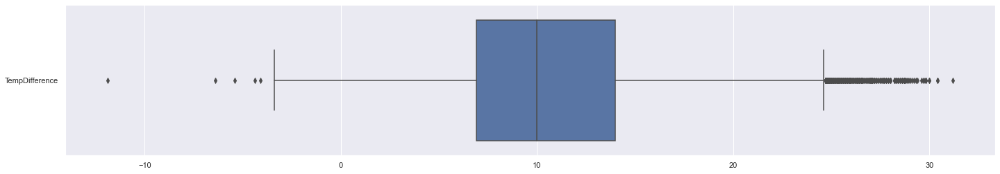

In [333]:
f = plt.figure(figsize=(24,4))
sb.boxplot(data=TempDifference,orient = "h")

# Split Of Data by 80-20

In [334]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(clean_dataframe, test_size=0.2)

In [335]:
train

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDifference
Row,,,,,,,,,,,,,,,
20613,20.4,24.1,4.8,74.0,50.0,46.0,77.000000,65.000000,1015.6,1016.1,21.9,23.8,1,1,3.7
15135,20.2,30.8,0.0,NaN,4.0,19.0,81.000000,51.000000,NaN,NaN,24.0,29.8,0,0,10.6
14388,0.1,15.7,0.0,28.0,15.0,15.0,79.000000,41.000000,1024.9,1021.8,6.9,15.5,0,0,15.6
679,8.2,23.2,0.0,39.0,6.0,19.0,71.000000,42.000000,1029.4,1028.1,14.8,22.3,0,0,15.0
99910,14.3,24.8,0.2,44.0,15.0,28.0,61.000000,45.000000,1011.3,1008.6,17.8,22.7,0,0,10.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77440,14.1,35.4,0.0,35.0,13.0,20.0,76.000000,29.000000,1014.3,1009.9,18.2,32.8,0,0,21.3
81275,1.8,14.7,0.0,33.0,0.0,9.0,99.000000,80.000000,1021.5,1020.7,4.9,13.9,0,0,12.9
67120,11.8,26.0,0.0,46.0,28.0,11.0,38.000000,22.000000,1023.9,1021.5,20.0,25.5,0,0,14.2


In [336]:
test

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDifference
Row,,,,,,,,,,,,,,,
63215,14.1,16.8,0.0,41.0,13.0,30.0,85.0,82.0,1021.0,1020.6,16.3,16.4,0,0,2.7
95829,27.5,34.7,0.0,35.0,22.0,26.0,69.0,68.0,1013.2,1009.8,32.3,32.5,0,1,7.2
73829,7.3,16.2,0.0,31.0,7.0,24.0,82.0,49.0,1019.1,1013.9,9.2,15.3,0,0,8.9
18793,17.1,23.0,29.2,46.0,6.0,15.0,86.0,83.0,1025.0,1024.3,20.1,21.0,1,0,5.9
62677,-0.4,24.1,0.0,69.0,4.0,22.0,82.0,28.0,1021.2,1014.4,7.8,20.0,0,0,24.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97744,4.5,13.4,7.2,39.0,11.0,20.0,87.0,70.0,1028.1,1027.8,7.6,13.1,1,1,8.9
54861,6.4,16.3,0.0,54.0,11.0,15.0,50.0,45.0,NaN,NaN,10.0,15.1,0,0,9.9
46459,13.7,27.7,0.0,52.0,4.0,28.0,81.0,36.0,1019.1,1015.5,16.9,27.2,0,0,14.0


# 2. Exploratory Data Analysis

In [337]:
RainToday = pd.DataFrame(train['RainToday'])
RainTomorrow = pd.DataFrame(train['RainTomorrow'])
TempDifference = pd.DataFrame(train['TempDifference'])
WindGustSpeed = pd.DataFrame(train['WindGustSpeed'])
Humidity9am = pd.DataFrame(train['Humidity9am'])
Pressure9am = pd.DataFrame(train['Pressure9am'])

<AxesSubplot:>

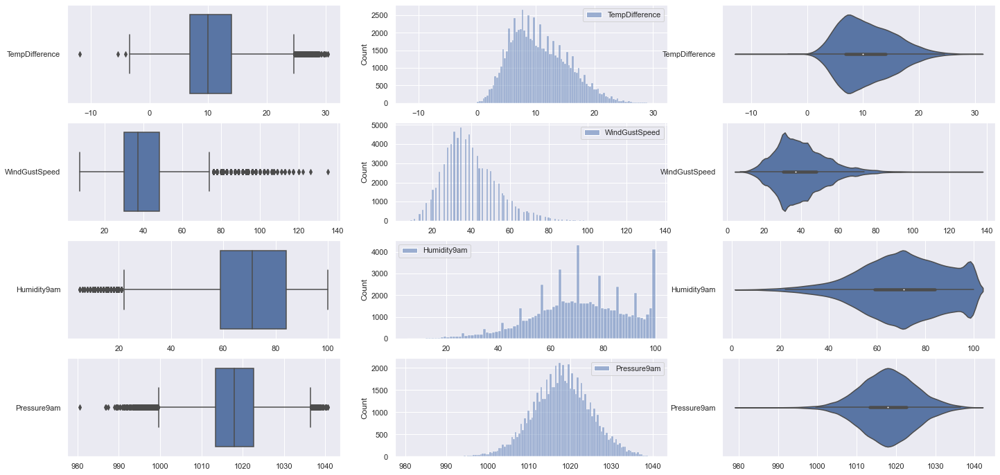

In [338]:
# Set up matplotlib figure with one subplots
f, axes = plt.subplots(4, 3, figsize=(24, 12))

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = TempDifference, orient = "h", ax = axes[0,0])
sb.histplot(data = TempDifference, ax = axes[0,1])
sb.violinplot(data = TempDifference, orient = "h", ax = axes[0,2])

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = WindGustSpeed, orient = "h", ax = axes[1,0])
sb.histplot(data = WindGustSpeed, ax = axes[1,1])
sb.violinplot(data = WindGustSpeed, orient = "h", ax = axes[1,2])

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = Humidity9am, orient = "h", ax = axes[2,0])
sb.histplot(data = Humidity9am, ax = axes[2,1])
sb.violinplot(data = Humidity9am, orient = "h", ax = axes[2,2])

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = Pressure9am, orient = "h", ax = axes[3,0])
sb.histplot(data = Pressure9am, ax = axes[3,1])
sb.violinplot(data = Pressure9am, orient = "h", ax = axes[3,2])

In [448]:
MinTemp = pd.DataFrame(train['MinTemp'])
MaxTemp = pd.DataFrame(train['MaxTemp'])

<AxesSubplot:ylabel='Density'>

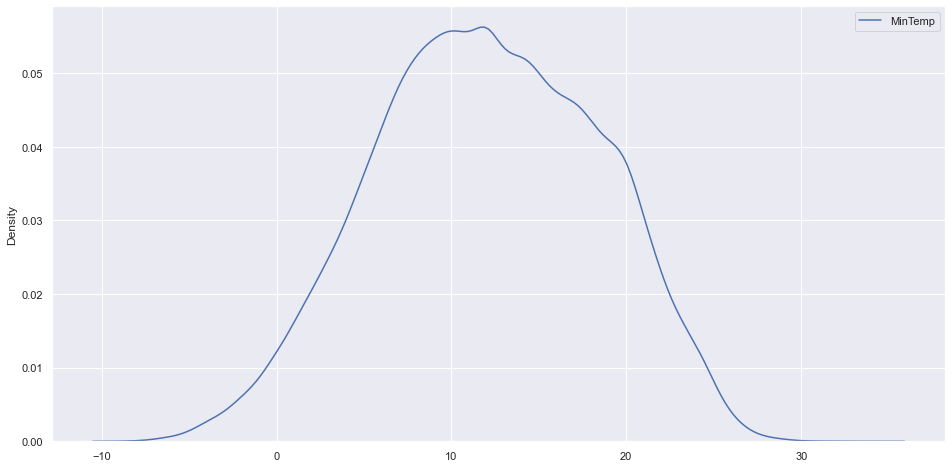

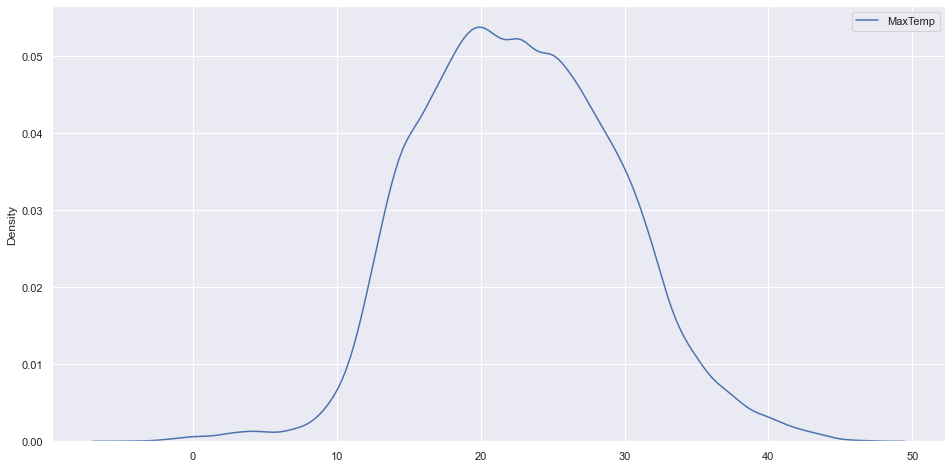

In [449]:
f = plt.figure(figsize=(16,8))
sb.kdeplot(data = MinTemp)

f = plt.figure(figsize=(16,8))
sb.kdeplot(data = MaxTemp)

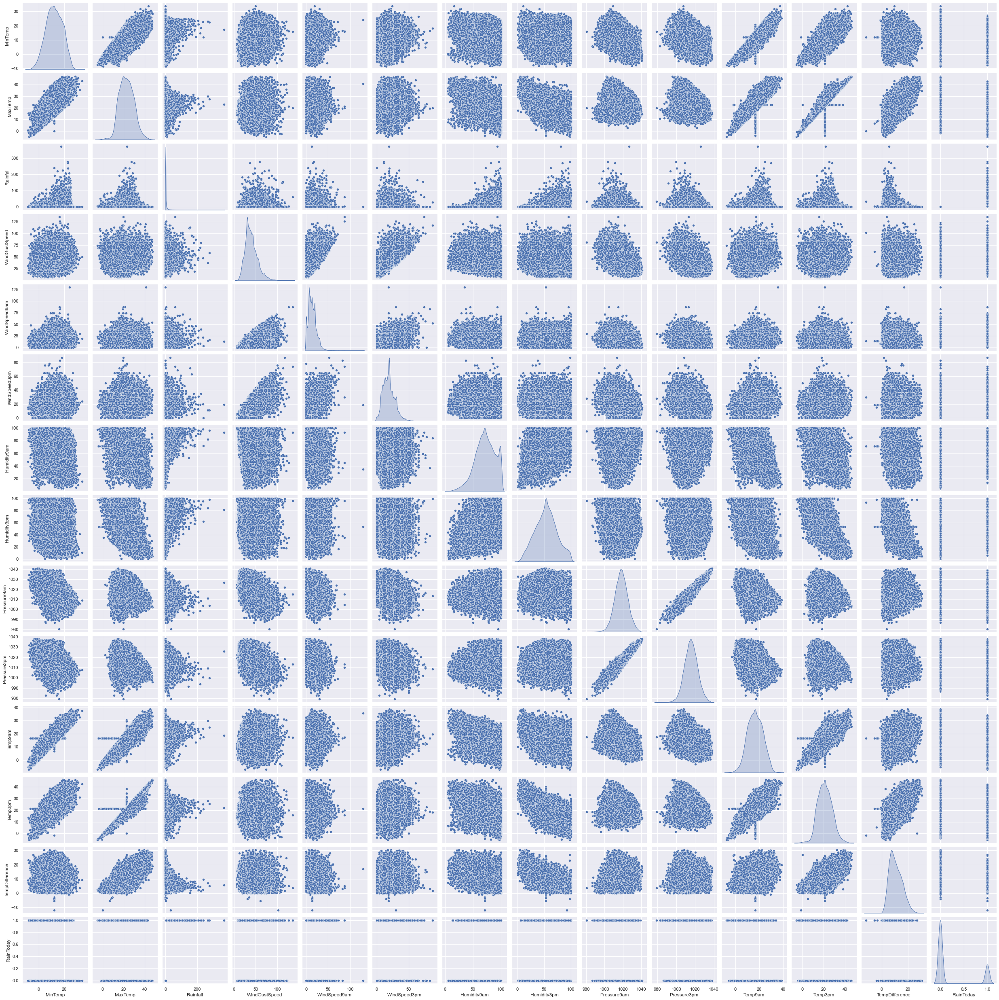

In [339]:
#Separating columns to be visualized
out_cols = list(set(train.nunique()[train.nunique()<6].keys().tolist()
                    + train.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in train.columns if x not in out_cols] + ['RainToday']

sb.pairplot(train[viz_cols], diag_kind="kde")
plt.show()

<AxesSubplot:xlabel='MaxTemp', ylabel='MinTemp'>

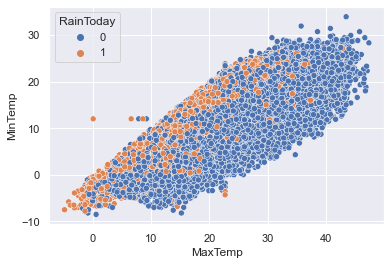

In [387]:
sb.scatterplot(data=train, x="MaxTemp", y="MinTemp", hue="RainToday")

<AxesSubplot:xlabel='Pressure9am', ylabel='Pressure3pm'>

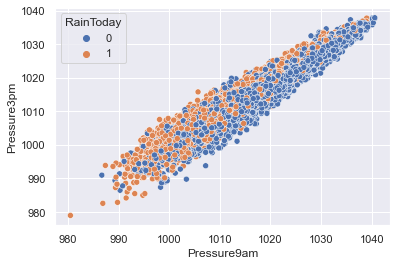

In [388]:
sb.scatterplot(data=train, x="Pressure9am", y="Pressure3pm", hue="RainToday")

<AxesSubplot:xlabel='Humidity9am', ylabel='Humidity3pm'>

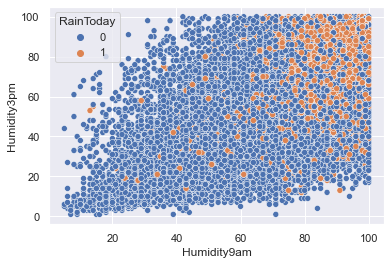

In [389]:
sb.scatterplot(data=train, x="Humidity9am", y="Humidity3pm", hue="RainToday")

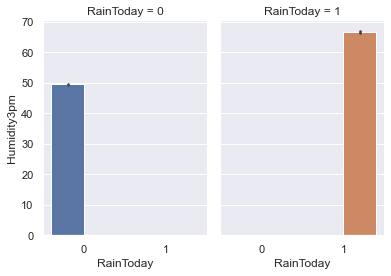

In [390]:
sb.catplot(x="RainToday", y="Humidity3pm",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);

<AxesSubplot:xlabel='WindSpeed9am', ylabel='WindSpeed3pm'>

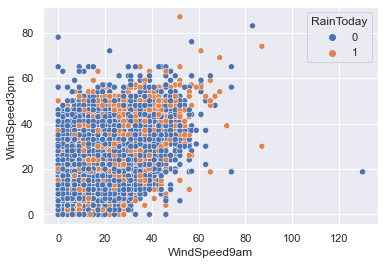

In [391]:
sb.scatterplot(data=train, x="WindSpeed9am", y="WindSpeed3pm", hue="RainToday")

<AxesSubplot:xlabel='Temp9am', ylabel='Temp3pm'>

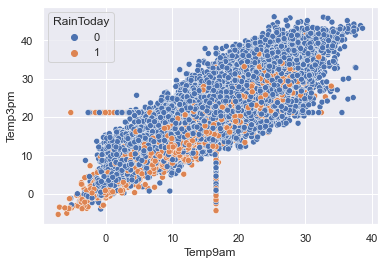

In [392]:
sb.scatterplot(data=train, x="Temp9am", y="Temp3pm", hue="RainToday")

<AxesSubplot:xlabel='TempDifference', ylabel='Temp3pm'>

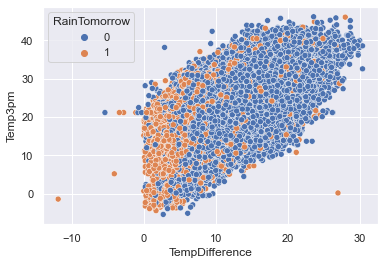

In [393]:
sb.scatterplot(data=train, x="TempDifference", y="Temp3pm", hue="RainTomorrow")

<AxesSubplot:xlabel='Rainfall', ylabel='Humidity3pm'>

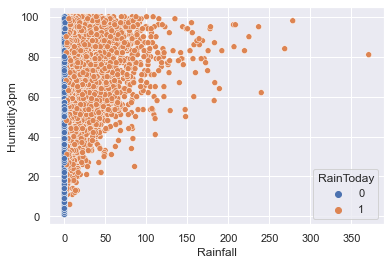

In [394]:
sb.scatterplot(data=train, x="Rainfall", y="Humidity3pm", hue="RainToday")

Rain Tomorrow Distribution : 2
0    60810
1    18058
Name: RainTomorrow, dtype: int64


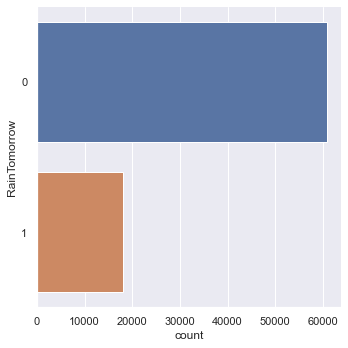

In [373]:
print("Rain Tomorrow Distribution :", len(train["RainTomorrow"].unique()))

print(train["RainTomorrow"].value_counts())
sb.catplot(y = "RainTomorrow", data = train, kind = "count")

Rain Today Distribution : 2
0    60662
1    18206
Name: RainToday, dtype: int64


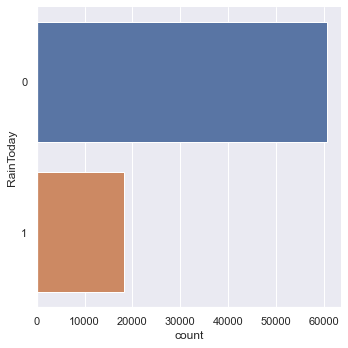

In [341]:
print("Rain Today Distribution :", len(train["RainToday"].unique()))

print(train["RainToday"].value_counts())
sb.catplot(y = "RainToday", data = train, kind = "count")

In [343]:
train.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 78868 entries, 20613 to 27130
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   MinTemp         78868 non-null  float64
 1   MaxTemp         78868 non-null  float64
 2   Rainfall        78868 non-null  float64
 3   WindGustSpeed   74391 non-null  float64
 4   WindSpeed9am    78868 non-null  float64
 5   WindSpeed3pm    78868 non-null  float64
 6   Humidity9am     78868 non-null  float64
 7   Humidity3pm     78868 non-null  float64
 8   Pressure9am     71301 non-null  float64
 9   Pressure3pm     71290 non-null  float64
 10  Temp9am         78868 non-null  float64
 11  Temp3pm         78868 non-null  float64
 12  RainToday       78868 non-null  int64  
 13  RainTomorrow    78868 non-null  int64  
 14  TempDifference  78868 non-null  float64
dtypes: float64(13), int64(2)
memory usage: 11.6 MB


In [344]:
# Extract only the numeric data variables
# include CAT TENURE

compare_numDF = pd.DataFrame(train[["MinTemp", "MaxTemp", "Rainfall", "WindGustSpeed", "WindSpeed9am", "WindSpeed3pm", "Humidity9am", "Humidity3pm", "Pressure9am", "Pressure3pm", "Temp9am", "Temp3pm", "TempDifference"]])

# Summary Statistics for all Variables
compare_numDF.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,TempDifference
count,78868.000000,78868.000000,78868.000000,74391.000000,78868.000000,78868.000000,78868.000000,78868.000000,71301.000000,71290.000000,78868.000000,78868.000000,78868.000000
mean,12.001578,22.691328,2.503455,39.638088,13.737857,18.720548,70.972597,53.477450,1017.996095,1015.644578,16.557747,21.197853,10.689751
std,6.375687,6.847372,9.085029,13.930258,9.083995,9.130090,17.698382,19.995753,7.014818,6.927670,6.348694,6.631289,4.884778
min,-8.500000,-4.800000,0.000000,7.000000,0.000000,0.000000,5.000000,1.000000,980.500000,979.000000,-7.200000,-5.400000,-11.899399
25%,7.400000,17.700000,0.000000,30.000000,7.000000,13.000000,59.000000,39.000000,1013.400000,1011.000000,11.900000,16.500000,6.900000
50%,11.999399,22.500000,0.000000,37.000000,13.000000,18.710951,71.005374,53.506545,1018.000000,1015.600000,16.552871,21.000000,10.000000
75%,16.900000,27.500000,0.800000,48.000000,19.000000,24.000000,84.000000,67.000000,1022.600000,1020.300000,21.200000,25.700000,14.000000
max,33.900000,47.300000,371.000000,135.000000,130.000000,87.000000,100.000000,100.000000,1040.600000,1037.900000,38.600000,46.200000,30.400000


In [345]:
# Calculate the complete correlation matrix
compare_numDF.corr()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,TempDifference
MinTemp,1.000000,0.729268,0.110836,0.161463,0.159494,0.176533,-0.233787,0.052019,-0.422200,-0.420043,0.910743,0.700129,-0.282945
MaxTemp,0.729268,1.000000,-0.061198,0.042400,-0.046237,0.045813,-0.448198,-0.466896,-0.321871,-0.404508,0.862863,0.975523,0.449926
Rainfall,0.110836,-0.061198,1.000000,0.131324,0.102224,0.056007,0.212639,0.243905,-0.150547,-0.115273,0.026026,-0.061921,-0.230451
WindGustSpeed,0.161463,0.042400,0.131324,1.000000,0.610211,0.706878,-0.202328,0.002987,-0.456575,-0.408962,0.135309,0.004706,-0.151517
WindSpeed9am,0.159494,-0.046237,0.102224,0.610211,1.000000,0.545718,-0.235502,0.045887,-0.229262,-0.164361,0.103615,-0.061204,-0.272988
WindSpeed3pm,0.176533,0.045813,0.056007,0.706878,0.545718,1.000000,-0.162958,0.024254,-0.303458,-0.261224,0.169973,0.020198,-0.166193
Humidity9am,-0.233787,-0.448198,0.212639,-0.202328,-0.235502,-0.162958,1.000000,0.605835,0.155976,0.186678,-0.446800,-0.437211,-0.323132
Humidity3pm,0.052019,-0.466896,0.243905,0.002987,0.045887,0.024254,0.605835,1.000000,-0.013722,0.054288,-0.152756,-0.519933,-0.722381
Pressure9am,-0.422200,-0.321871,-0.150547,-0.456575,-0.229262,-0.303458,0.155976,-0.013722,1.000000,0.961230,-0.401380,-0.279907,0.107665
Pressure3pm,-0.420043,-0.404508,-0.115273,-0.408962,-0.164361,-0.261224,0.186678,0.054288,0.961230,1.000000,-0.434991,-0.371797,-0.006632


<AxesSubplot:>

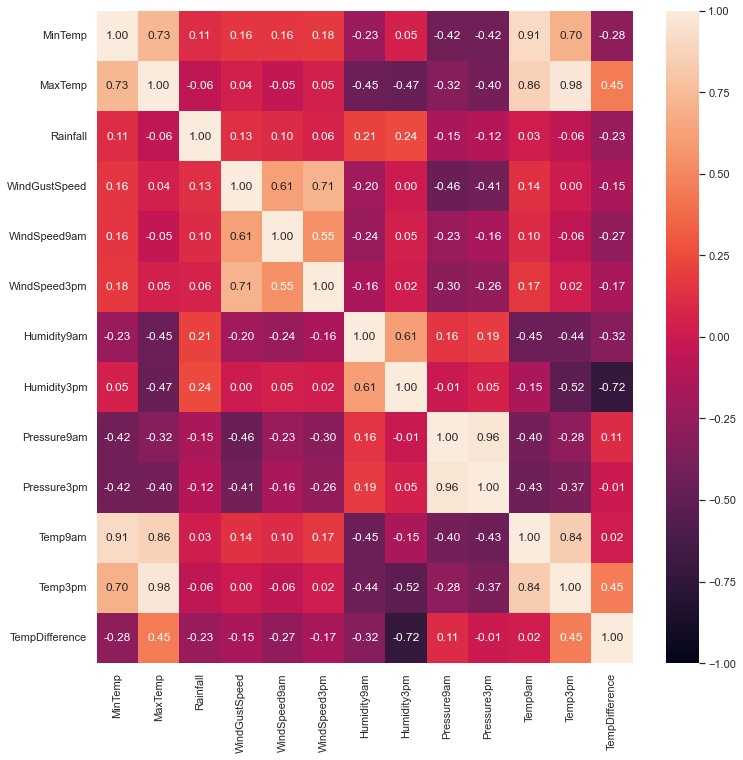

In [346]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(12, 12))
sb.heatmap(compare_numDF.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

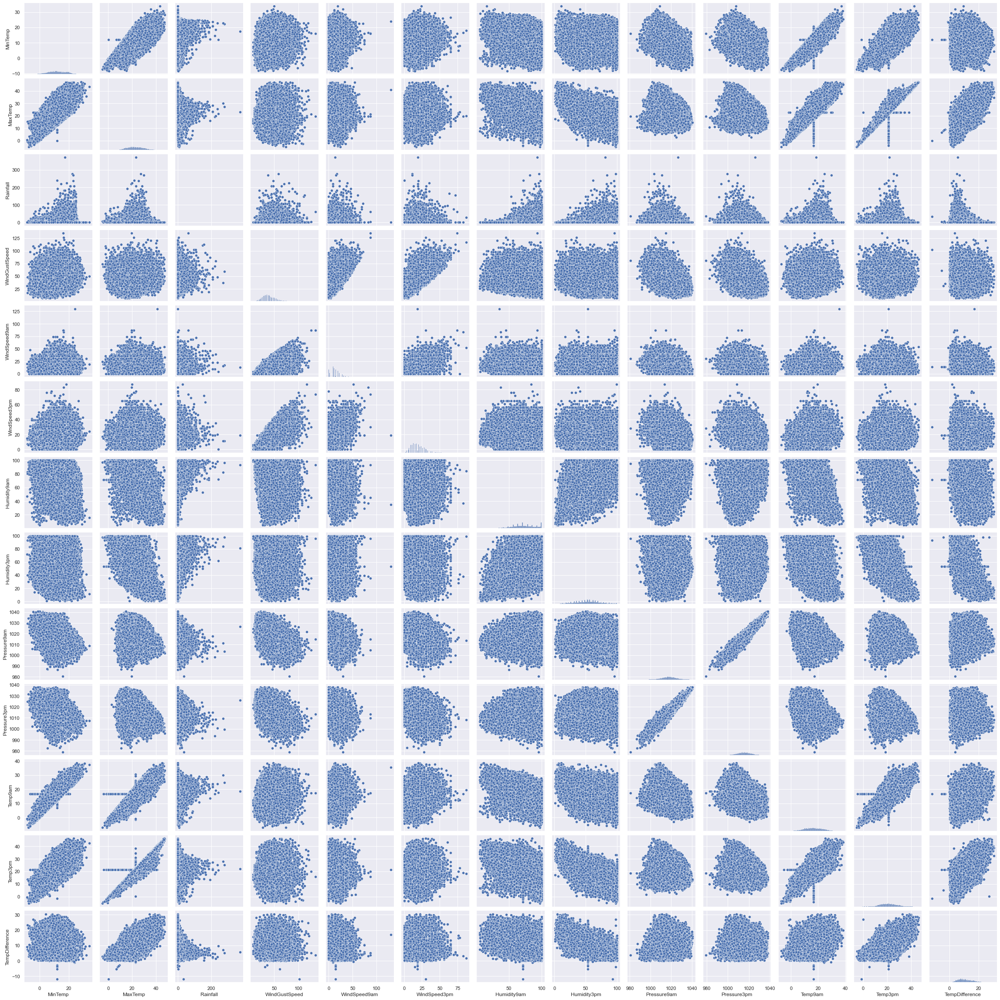

In [347]:
# Draw pairs of variables against one another
sb.pairplot(data = compare_numDF)

In [348]:
train.loc[train["RainToday"] == 1]

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDifference
Row,,,,,,,,,,,,,,,
20613,20.4,24.1,4.8,74.0,50.0,46.0,77.0,65.0,1015.6,1016.1,21.9,23.8,1,1,3.7
100784,4.4,14.3,1.4,48.0,19.0,24.0,94.0,82.0,1022.6,1022.9,7.7,11.9,1,1,9.9
25303,17.4,25.7,2.4,19.0,7.0,6.0,81.0,59.0,NaN,NaN,20.6,24.2,1,0,8.3
38552,14.1,20.2,8.2,50.0,13.0,30.0,81.0,46.0,1007.0,1006.6,18.2,18.3,1,1,6.1
76816,16.2,20.6,11.8,20.0,11.0,11.0,100.0,84.0,1018.0,1015.5,17.2,20.2,1,0,4.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85613,21.3,29.5,3.4,24.0,0.0,6.0,73.0,87.0,1011.9,1010.3,25.8,24.3,1,0,8.2
101074,6.4,14.1,22.0,35.0,11.0,13.0,82.0,61.0,1022.2,1024.3,10.1,12.2,1,0,7.7
54180,10.3,21.3,3.2,81.0,24.0,31.0,94.0,31.0,NaN,NaN,11.9,20.6,1,0,11.0


<AxesSubplot:>

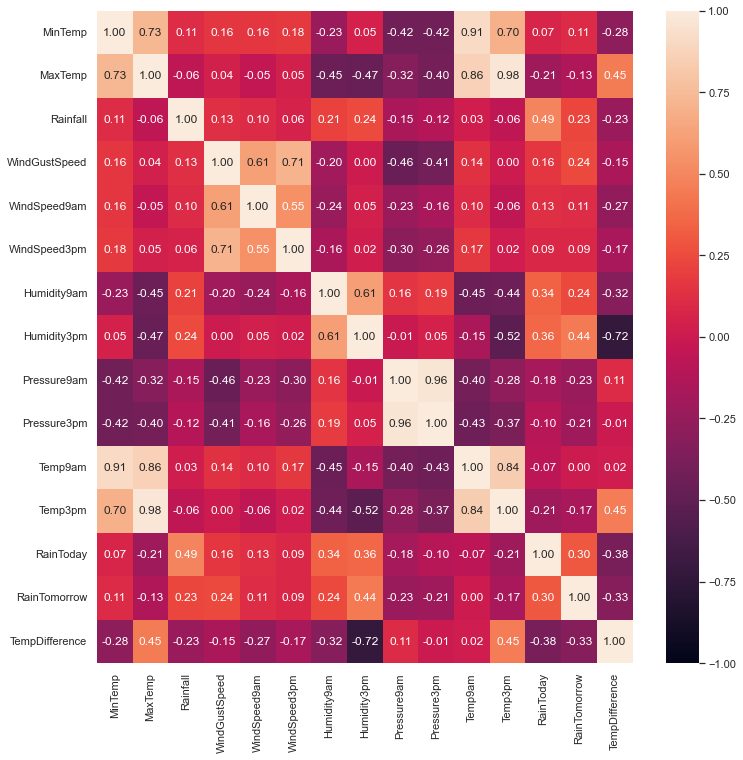

In [349]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(12, 12))
sb.heatmap(train.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

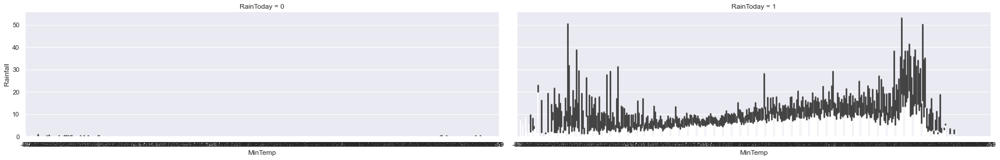

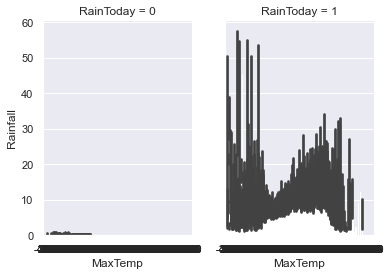

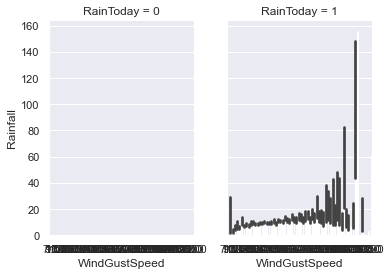

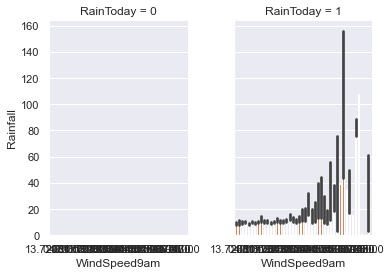

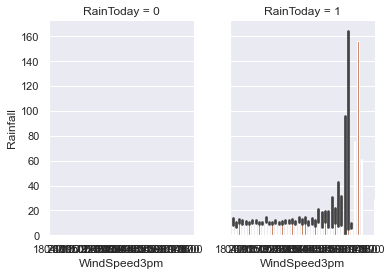

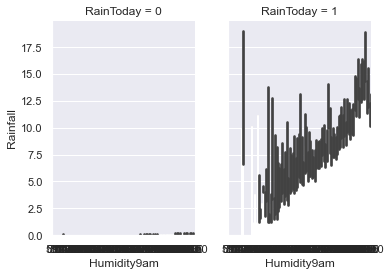

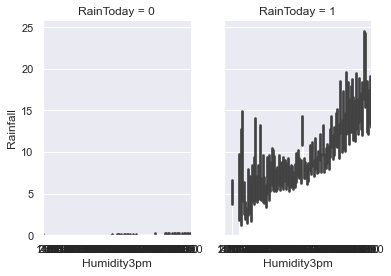

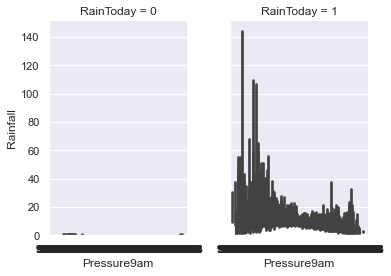

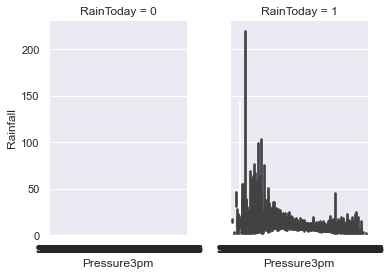

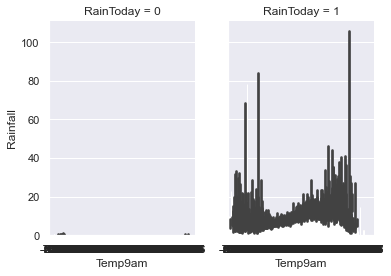

Error in callback <function flush_figures at 0x7fc4b2db1dc0> (for post_execute):


KeyboardInterrupt: 

In [363]:
a = sb.catplot(x="MinTemp", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=3);
b = sb.catplot(x="MaxTemp", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
c = sb.catplot(x="WindGustSpeed", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
d = sb.catplot(x="WindSpeed9am", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
e = sb.catplot(x="WindSpeed3pm", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
f = sb.catplot(x="Humidity9am", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
g = sb.catplot(x="Humidity3pm", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
h = sb.catplot(x="Pressure9am", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
i = sb.catplot(x="Pressure3pm", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
j = sb.catplot(x="Temp9am", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);
k = sb.catplot(x="Temp3pm", y="Rainfall",
                hue="RainToday", col="RainToday",
                data=train, kind="bar",
                height=4, aspect=.7);

# 3. Prediction for RainToday

# Humidity3pm - Decision Tree - 0.9584708289334741

In [383]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

# Extract Response and Predictors
y = pd.DataFrame(clean_dataframe['RainToday'])
X = pd.DataFrame(clean_dataframe['Humidity3pm'])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 4)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

DecisionTreeClassifier(max_depth=4)

[Text(1395.0, 2446.2, 'Humidity3pm <= 62.5\ngini = 0.356\nsamples = 78868\nvalue = [60608, 18260]\nclass = N'),
 Text(697.5, 1902.6, 'Humidity3pm <= 46.5\ngini = 0.242\nsamples = 53432\nvalue = [45904, 7528]\nclass = N'),
 Text(348.75, 1359.0, 'Humidity3pm <= 33.5\ngini = 0.149\nsamples = 28175\nvalue = [25891, 2284]\nclass = N'),
 Text(174.375, 815.3999999999999, 'Humidity3pm <= 20.5\ngini = 0.081\nsamples = 13526\nvalue = [12953, 573]\nclass = N'),
 Text(87.1875, 271.7999999999997, 'gini = 0.03\nsamples = 4120\nvalue = [4058, 62]\nclass = N'),
 Text(261.5625, 271.7999999999997, 'gini = 0.103\nsamples = 9406\nvalue = [8895, 511]\nclass = N'),
 Text(523.125, 815.3999999999999, 'Humidity3pm <= 40.5\ngini = 0.206\nsamples = 14649\nvalue = [12938, 1711]\nclass = N'),
 Text(435.9375, 271.7999999999997, 'gini = 0.179\nsamples = 7293\nvalue = [6568, 725]\nclass = N'),
 Text(610.3125, 271.7999999999997, 'gini = 0.232\nsamples = 7356\nvalue = [6370, 986]\nclass = N'),
 Text(1046.25, 1359.0, 'H

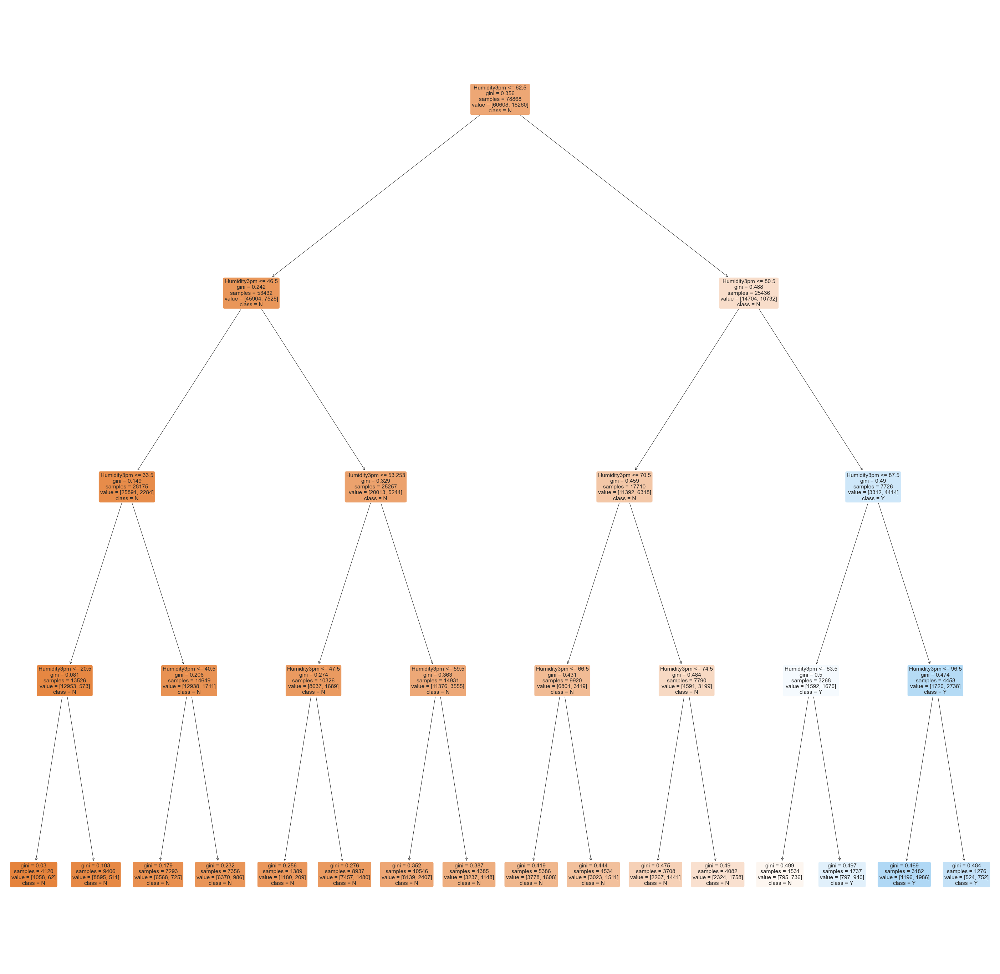

In [384]:
# Plot the trained Decision Tree
from sklearn.tree import plot_tree

f = plt.figure(figsize=(50,50))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X_train.columns, 
          class_names=["N","Y"])

Goodness of Fit of Model 	Train Dataset
Classification Accuracy :	 0.7831947050768372

TPR Train :	 0.20142387732749178
TNR Train :	 0.9584708289334741

FPR Train :	 0.04152917106652587
FNR Train :	 0.7985761226725082


<AxesSubplot:>

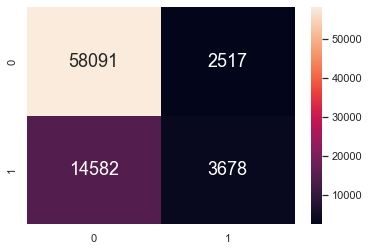

In [385]:
# Import the required metric from sklearn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)

# Print the Classification Accuracy
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy :\t", dectree.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Y (1) predicted Y (1)
fpTrain = cmTrain[0][1] # False Positives : N (0) predicted Y (1)
tnTrain = cmTrain[0][0] # True Negatives : N (0) predicted N (0)
fnTrain = cmTrain[1][0] # False Negatives : Y (1) predicted N (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Goodness of Fit of Model 	Test Dataset
Classification Accuracy :	 0.78450068468834

TPR Test :	 0.19596668128014028
TNR Test :	 0.961662817551963

FPR Test :	 0.03833718244803695
FNR Test :	 0.8040333187198597


<AxesSubplot:>

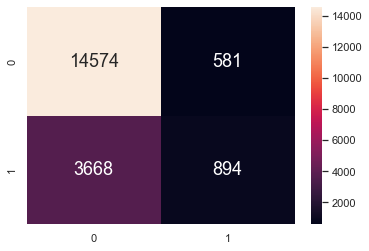

In [386]:
# Import the required metric from sklearn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_test_pred = dectree.predict(X_test)

# Print the Classification Accuracy
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy :\t", dectree.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTest = confusion_matrix(y_test, y_test_pred)
tpTest = cmTest[1][1] # True Positives : Y (1) predicted Y (1)
fpTest = cmTest[0][1] # False Positives : N (0) predicted Y (1)
tnTest = cmTest[0][0] # True Negatives : N (0) predicted N (0)
fnTest = cmTest[1][0] # False Negatives : Y (1) predicted N (0)

print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
print()

print("FPR Test :\t", (fpTest/(fpTest + tnTest)))
print("FNR Test :\t", (fnTest/(fnTest + tpTest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})


# All Attributes - Decision Tree - 0.7874911158493249

In [421]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

# Extract Response and Predictors
y = pd.DataFrame(clean_dataframe['RainToday'])
X = pd.DataFrame(clean_dataframe['MinTemp','MaxTemp','Rainfall','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Temp9am','Temp3pm'])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 4)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

KeyError: ('MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm')

In [ ]:
# Import essential models and functions from sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
y = pd.DataFrame(full_dataframe['RainToday'])
X = pd.DataFrame(full_dataframe[['MinTemp','MaxTemp','Rainfall','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Temp9am','Temp3pm']])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
rforest = RandomForestClassifier(n_estimators = 300, 
                                 max_depth = 9)       
rforest.fit(X_train, y_train.RainToday.ravel())

# Learning Tools

In [422]:
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import numpy as np

In [423]:
Humidity3pm = pd.DataFrame(train['Humidity3pm'])   # Response
RainToday = pd.DataFrame(train['RainToday'])       # Predictor

In [424]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(Humidity3pm, RainToday, test_size = 0.20)

# Logistic Regression

Logistic regression is a process of modeling the probability of a discrete outcome given an input variable. The most common logistic regression models a binary outcome; something that can take two values such as true/false, yes/no, and so on.

In [425]:
lr = LogisticRegression(solver='liblinear',multi_class='ovr')
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

0.7824267782426778

# Support Vector Machine (SVM)

Support vector machines (SVMs) are a set of supervised learning methods used for classification, regression and outliers detection. Effective in high dimensional spaces. Still effective in cases where number of dimensions is greater than the number of samples. Uses a subset of training points in the decision function (called support vectors), so it is also memory efficient. Versatile: different Kernel functions can be specified for the decision function. Common kernels are provided, but it is also possible to specify custom kernels.

In [426]:
svm = SVC(gamma='auto')
svm.fit(X_train, y_train)
svm.score(X_test, y_test)

0.7811588690249778

# Random Forest

In [427]:
rf = RandomForestClassifier(n_estimators=40)
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

0.7810320781032078

# KFold Cross Validation

K-Folds cross-validator. Provides train/test indices to split data in train/test sets. Split dataset into k consecutive folds (without shuffling by default). Each fold is then used once as a validation while the k - 1 remaining folds form the training set.

In [428]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=3)
kf

KFold(n_splits=3, random_state=None, shuffle=False)

In [429]:
for train_index, test_index in kf.split([1,2,3,4,5,6,7,8,9]):
    print(train_index, test_index)

[3 4 5 6 7 8] [0 1 2]
[0 1 2 6 7 8] [3 4 5]
[0 1 2 3 4 5] [6 7 8]


In [430]:
def get_score(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    return model.score(X_test, y_test)

In [431]:
from sklearn.model_selection import StratifiedKFold
from sklearn.datasets import load_digits
digits = load_digits()

folds = StratifiedKFold(n_splits=3)

scores_logistic = []
scores_svm = []
scores_rf = []

for train_index, test_index in folds.split(digits.data,digits.target):
    X_train, X_test, y_train, y_test = digits.data[train_index], digits.data[test_index], \
                                       digits.target[train_index], digits.target[test_index]
    scores_logistic.append(get_score(LogisticRegression(solver='liblinear',multi_class='ovr'), X_train, X_test, y_train, y_test))  
    scores_svm.append(get_score(SVC(gamma='auto'), X_train, X_test, y_train, y_test))
    scores_rf.append(get_score(RandomForestClassifier(n_estimators=40), X_train, X_test, y_train, y_test))


In [432]:
scores_logistic

[0.8948247078464107, 0.9532554257095158, 0.9098497495826378]

In [433]:
scores_svm

[0.3806343906510851, 0.41068447412353926, 0.5125208681135225]

In [434]:
scores_rf

[0.9248747913188647, 0.9565943238731218, 0.9332220367278798]

# cross_val_score function

In [435]:
from sklearn.model_selection import cross_val_score

# Logistic regression model performance using cross_val_score

In [436]:
cross_val_score(LogisticRegression(solver='liblinear',multi_class='ovr'), digits.data, digits.target,cv=3)

array([0.89482471, 0.95325543, 0.90984975])

# svm model performance using cross_val_score

In [437]:
cross_val_score(SVC(gamma='auto'), digits.data, digits.target,cv=3)

array([0.38063439, 0.41068447, 0.51252087])

# random forest performance using cross_val_score

In [438]:
cross_val_score(RandomForestClassifier(n_estimators=40),digits.data, digits.target,cv=3)

array([0.92487479, 0.95659432, 0.92153589])

In [439]:
scores1 = cross_val_score(RandomForestClassifier(n_estimators=5),digits.data, digits.target, cv=10)
np.average(scores1)

0.8764525139664805

In [440]:
scores2 = cross_val_score(RandomForestClassifier(n_estimators=20),digits.data, digits.target, cv=10)
np.average(scores2)

0.9438081936685287

In [441]:
scores3 = cross_val_score(RandomForestClassifier(n_estimators=30),digits.data, digits.target, cv=10)
np.average(scores3)

0.9376567349472376

In [442]:
scores4 = cross_val_score(RandomForestClassifier(n_estimators=40),digits.data, digits.target, cv=10)
np.average(scores4)

0.9449037864680323

In [443]:
scores5 = cross_val_score(RandomForestClassifier(n_estimators=50),digits.data, digits.target, cv=10)
np.average(scores5)

0.9437864680322781

# After n_estimate crossed 5, the accuracy decreased. We used cross_val_score to fine tune our random forest performance and 40 trees gives the best performance.